### The German Traffic Sign Benchmark

Student Name 1: ...

Student Name 2: ...

Download full data set from http://benchmark.ini.rub.de/?section=gtsdb&subsection=dataset

In [1]:
import numpy as np
import cv2

IMG_HEIGHT = 600
SIGN_SIZE = (224, 224)
#SIGN_SIZE = (32, 32)

# Function for reading the images
def readImages(rootpath, images_range, signs_range):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.
    Arguments: path to the traffic sign data, for example 'FullIJCNN2013'
    Returns:   list of images, list of corresponding labels'''
    images = {} # original image
    scales = {} # original scale
    for num in images_range:
        filename = rootpath + '/' + "{:05d}".format(num) + '.ppm'
        img = cv2.imread(filename, cv2.IMREAD_COLOR)
        scale = IMG_HEIGHT / float(img.shape[0])
        img_resized = cv2.resize(img, (int(img.shape[1]*scale),int(img.shape[0]*scale)))
        images.setdefault(filename,[]).append(img_resized)
        scales.setdefault(filename,[]).append(scale)

    files = [] # filenames
    signs = [] # traffic sign image
    bboxes = [] # corresponding box detection
    labels = [] # traffic sign type
    data = np.genfromtxt(rootpath + '/' + 'gt.txt', delimiter=';', dtype=str, usecols=range(0, 6))
    for elem in signs_range:
        filename = rootpath + '/' + data[elem][0]
        img = images.get(filename)[0]
        scale = scales.get(filename)[0]
        bbox = np.array([int(data[elem][1]), int(data[elem][2]), int(data[elem][3]), int(data[elem][4])]) * scale
        sign = img[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
        sign_resized = cv2.resize(sign, SIGN_SIZE)
        files.append(filename)
        signs.append(sign_resized)
        bboxes.append(bbox)
        labels.append(data[elem][5])
    return images, files, signs, bboxes, labels

In [2]:
# The German Traffic Sign Recognition Benchmark
train_images, train_files, train_signs, train_bboxes, train_labels = readImages('../FullIJCNN2013', range(0,600), range(0,852))
test_images, test_files, test_signs, test_bboxes, test_labels = readImages('../FullIJCNN2013', range(600,900), range(852,1213))

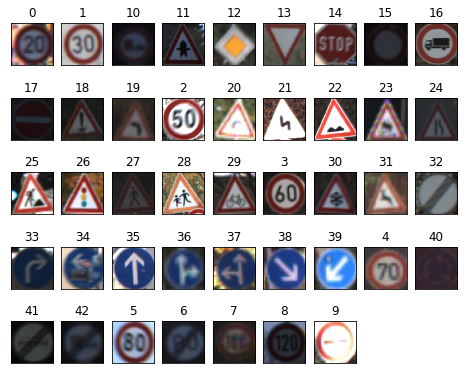

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline 

# Show examples from each class
class_names = np.unique(train_labels)
num_classes = len(class_names)
fig = plt.figure(figsize=(8,8))
for i in range(num_classes):
    ax = fig.add_subplot(6, 9, 1 + i, xticks=[], yticks=[])
    ax.set_title(class_names[i])
    indices = np.where(np.isin(train_labels, class_names[i]))[0]
    plt.imshow(cv2.cvtColor(train_signs[int(np.random.choice(indices, 1))], cv2.COLOR_BGR2RGB))
plt.show()

In [4]:
from sklearn.utils import shuffle
train_files, train_signs, train_bboxes, train_labels = shuffle(train_files, train_signs, train_bboxes, train_labels)
# plt.imshow(cv2.cvtColor(train_images.get(train_files[0])[0], cv2.COLOR_BGR2RGB))
# plt.show()
# plt.imshow(cv2.cvtColor(train_signs[0], cv2.COLOR_BGR2RGB))
# plt.show()
# print(train_bboxes[0])
# print(train_labels[0])

# Data pre-processing
tr_signs = np.array(train_signs)[0:600]
tr_labels = np.array(train_labels)[0:600]
va_signs = np.array(train_signs)[600:852]
va_labels = np.array(train_labels)[600:852]
te_signs = np.array(test_signs)
te_labels = np.array(test_labels)

tr_signs = tr_signs.astype('float32')
va_signs = va_signs.astype('float32')
te_signs = te_signs.astype('float32')
tr_signs /= 255.0
va_signs /= 255.0
te_signs /= 255.0

from keras.utils import np_utils
tr_labels = np_utils.to_categorical(tr_labels, num_classes)
va_labels = np_utils.to_categorical(va_labels, num_classes)
te_labels = np_utils.to_categorical(te_labels, num_classes)

Using TensorFlow backend.


In [5]:
# Tensorboard
from time import time
from keras.callbacks import TensorBoard
tensorboard = TensorBoard(log_dir='logs/{}'.format(time()))

## Assignment 3.4: Traffic sign detection

sudo pip install Keras==2.1.6

In [6]:
ANCHOR_RATIOS = (0.5, 1.0, 2.0)
ANCHOR_STRIDE = 16
ANCHOR_SIZES = (32, 64, 128, 256, 512)
MAX_SIZE = 1344
MIN_SIZE = 0

# Parameters to play with to modify the number of proposal in each image
TEST_PRE_NMS_TOPK = 8000 # The maximum number of positive samples taken during proposal generation, pre NMS
TEST_POST_NMS_TOPK = 1000 # The maximum number of positive samples taken during proposal generation, post NMS
PROPOSAL_NMS_THRESH = 0.7

In [7]:
"""Operations for [N, 4] numpy arrays representing bounding boxes.
Example box operations that are supported:
  * Areas: compute bounding box areas
  * IOU: pairwise intersection-over-union scores
"""
def area(boxes):
    """Computes area of boxes.
    Args:
    boxes: Numpy array with shape [N, 4] holding N boxes
    Returns:
    a numpy array with shape [N*1] representing box areas
    """
    return (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])

def intersection(boxes1, boxes2):
    """Compute pairwise intersection areas between boxes.
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes
    boxes2: a numpy array with shape [M, 4] holding M boxes
    Returns:
    a numpy array with shape [N*M] representing pairwise intersection area
    """
    [x_min1, y_min1, x_max1, y_max1] = np.split(boxes1, 4, axis=1)
    [x_min2, y_min2, x_max2, y_max2] = np.split(boxes2, 4, axis=1)
    all_pairs_min_ymax = np.minimum(y_max1, np.transpose(y_max2))
    all_pairs_max_ymin = np.maximum(y_min1, np.transpose(y_min2))
    intersect_heights = np.maximum(np.zeros(all_pairs_max_ymin.shape, dtype='f4'),all_pairs_min_ymax - all_pairs_max_ymin)
    all_pairs_min_xmax = np.minimum(x_max1, np.transpose(x_max2))
    all_pairs_max_xmin = np.maximum(x_min1, np.transpose(x_min2))
    intersect_widths = np.maximum(np.zeros(all_pairs_max_xmin.shape, dtype='f4'),all_pairs_min_xmax - all_pairs_max_xmin)
    return intersect_heights * intersect_widths

def iou(boxes1, boxes2):
    """Computes pairwise intersection-over-union between box collections.
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes.
    boxes2: a numpy array with shape [M, 4] holding M boxes.
    Returns:
    a numpy array with shape [N, M] representing pairwise iou scores.
    """
    intersect = intersection(boxes1, boxes2)
    area1 = area(boxes1)
    area2 = area(boxes2)
    union = np.expand_dims(area1, axis=1) + np.expand_dims(area2, axis=0) - intersect
    return intersect / union

def ioa(boxes1, boxes2):
    """Computes pairwise intersection-over-area between box collections.
    Intersection-over-area (ioa) between two boxes box1 and box2 is defined as
    their intersection area over box2's area. Note that ioa is not symmetric,
    that is, IOA(box1, box2) != IOA(box2, box1).
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes.
    boxes2: a numpy array with shape [M, 4] holding N boxes.
    Returns:
    a numpy array with shape [N, M] representing pairwise ioa scores.
    """
    intersect = intersection(boxes1, boxes2)
    inv_areas = np.expand_dims(1.0 / area(boxes2), axis=0)
    return intersect * inv_areas

def clip_boxes(bboxes, clip_box, alpha):
    """
    This function clip the bboxes to the border of the image

    :param bboxes: array of shape (Nx4) containing the coordinates of the bboxes
                in the format: xmin, ymin, xmax, ymax.
    :param clip_box: array of shape (4,) containing the coordinates of the image
                in the format: xmin, ymin, xmax ymax.
    :param alpha:float, minimum threshold of area acepted. If a clipped bbpx
                    have an relative area (wrt their original area) less than
                    alpha, it is discarded.
    :return: numpy array Nx4 of the clipped bboxes with their new coordinates
            in the format xmin, ymin, xmax, ymax.
    """
    areas = area(bboxes)
    bboxes[:, 0] = np.maximum(bboxes[:, 0], clip_box[0])
    bboxes[:, 1] = np.maximum(bboxes[:, 1], clip_box[1])
    bboxes[:, 2] = np.minimum(bboxes[:, 2], clip_box[2])
    bboxes[:, 3] = np.minimum(bboxes[:, 3], clip_box[3])
    new_areas = area(bboxes)
    delta_area = (areas - new_areas) / areas
    mask = np.where(delta_area < 1 - alpha)
    bboxes = bboxes[mask[0]]
    return bboxes

In [8]:
import tensorflow as tf

def generate_anchors(base_size=16, ratios=[0.5, 1, 2], scales=2**np.arange(3, 6)):
    """
    Generate anchor (reference) windows by enumerating aspect ratios X
    scales wrt a reference (0, 0, 15, 15) window.
    """
    base_anchor = np.array([1, 1, base_size, base_size], dtype='float32') - 1
    ratio_anchors = _ratio_enum(base_anchor, ratios)
    anchors = np.vstack([_scale_enum(ratio_anchors[i, :], scales) for i in range(ratio_anchors.shape[0])])
    return anchors

def _whctrs(anchor):
    """
    Return width, height, x center, and y center for an anchor (window).
    """
    w = anchor[2] - anchor[0] + 1
    h = anchor[3] - anchor[1] + 1
    x_ctr = anchor[0] + 0.5 * (w - 1)
    y_ctr = anchor[1] + 0.5 * (h - 1)
    return w, h, x_ctr, y_ctr

def _mkanchors(ws, hs, x_ctr, y_ctr):
    """
    Given a vector of widths (ws) and heights (hs) around a center
    (x_ctr, y_ctr), output a set of anchors (windows).
    """
    ws = ws[:, np.newaxis]
    hs = hs[:, np.newaxis]
    anchors = np.hstack((x_ctr - 0.5 * (ws - 1), y_ctr - 0.5 * (hs - 1), x_ctr + 0.5 * (ws - 1), y_ctr + 0.5 * (hs - 1)))
    return anchors

def _ratio_enum(anchor, ratios):
    """
    Enumerate a set of anchors for each aspect ratio wrt an anchor.
    """
    w, h, x_ctr, y_ctr = _whctrs(anchor)
    size = w * h
    size_ratios = size / ratios
    ws = np.round(np.sqrt(size_ratios))
    hs = np.round(ws * ratios)
    anchors = _mkanchors(ws, hs, x_ctr, y_ctr)
    return anchors

def _scale_enum(anchor, scales):
    """
    Enumerate a set of anchors for each scale wrt an anchor.
    """
    w, h, x_ctr, y_ctr = _whctrs(anchor)
    ws = w * scales
    hs = h * scales
    anchors = _mkanchors(ws, hs, x_ctr, y_ctr)
    return anchors

def get_all_anchors(stride=None, sizes=None):
    """
    Get all anchors in the largest possible image, shifted, floatbox
    Args:
        stride (int): the stride of anchors.
        sizes (tuple[int]): the sizes (sqrt area) of anchors

    Returns:
        anchors: SxSxNUM_ANCHORx4, where S == ceil(MAX_SIZE/STRIDE), floatbox
        The layout in the NUM_ANCHOR dim is NUM_RATIO x NUM_SIZE.

    """
    if stride is None:
        stride = ANCHOR_STRIDE
    if sizes is None:
        sizes = ANCHOR_SIZES
    # Generates a NAx4 matrix of anchor boxes in (x1, y1, x2, y2) format. Anchors
    # are centered on stride / 2, have (approximate) sqrt areas of the specified
    # sizes, and aspect ratios as given.
    cell_anchors = generate_anchors(stride, scales=np.array(sizes, dtype=np.float) / stride, ratios=np.array(ANCHOR_RATIOS, dtype=np.float))
    # anchors are intbox here.
    # anchors at featuremap [0,0] are centered at fpcoor (8,8) (half of stride)
    field_size = int(np.ceil(MAX_SIZE / stride))
    shifts = np.arange(0, field_size) * stride
    shift_x, shift_y = np.meshgrid(shifts, shifts)
    shift_x = shift_x.flatten()
    shift_y = shift_y.flatten()
    shifts = np.vstack((shift_x, shift_y, shift_x, shift_y)).transpose()
    K = shifts.shape[0]

    A = cell_anchors.shape[0]
    field_of_anchors = (
        cell_anchors.reshape((1, A, 4)) +
        shifts.reshape((1, K, 4)).transpose((1, 0, 2)))
    field_of_anchors = field_of_anchors.reshape((field_size, field_size, A, 4))
    field_of_anchors = field_of_anchors.astype('float32')
    field_of_anchors[:, :, :, [2, 3]] += 1
    return field_of_anchors

def decode_bbox_target(box_predictions, anchors):
    """
    Args:
        box_predictions: (..., 4), logits
        anchors: (..., 4), floatbox. Must have the same shape

    Returns:
        box_decoded: (..., 4), float32. With the same shape.
    """
    orig_shape = tf.shape(anchors)
    box_pred_txtytwth = tf.reshape(box_predictions, (-1, 2, 2))
    box_pred_txty, box_pred_twth = tf.split(box_pred_txtytwth, 2, axis=1)
    anchors_x1y1x2y2 = tf.reshape(anchors, (-1, 2, 2))
    anchors_x1y1, anchors_x2y2 = tf.split(anchors_x1y1x2y2, 2, axis=1)

    waha = anchors_x2y2 - anchors_x1y1
    xaya = (anchors_x2y2 + anchors_x1y1) * 0.5
    clip = np.log(MAX_SIZE / 16.)
    wbhb = tf.exp(tf.minimum(box_pred_twth, clip)) * waha
    xbyb = box_pred_txty * waha + xaya
    x1y1 = xbyb - wbhb * 0.5
    x2y2 = xbyb + wbhb * 0.5
    out = tf.concat([x1y1, x2y2], axis=-2)
    return tf.reshape(out, orig_shape)

def narrow_to_c4(featuremaps, anchor_boxes):
    """
    Slice anchors to the spatial size of this featuremap.
    """
    shape2d = tf.shape(featuremaps)[2:]  # h,w
    slice4d = tf.concat([shape2d, [-1, -1]], axis=0)
    anchor_boxes = tf.slice(anchor_boxes, [0, 0, 0, 0], slice4d)
    return anchor_boxes

def clip_boxes(boxes, window, name=None):
    """
    Args:
        boxes: nx4, xyxy
        window: [h, w]
    """
    boxes = tf.maximum(boxes, 0.0)
    m = tf.tile(tf.reverse(window, [0]), [2])  # (4,)
    boxes = tf.minimum(boxes, tf.to_float(m), name=name)
    return boxes

In [9]:
def generate_rpn_proposals(boxes_and_scores, img_shape, pre_nms_topk, post_nms_topk):
    """
    Sample RPN proposals by the following steps:
    1. Pick top k1 by scores
    2. NMS them
    3. Pick top k2 by scores. Default k2 == k1, i.e. does not filter the NMS output.

    Args:
        boxes: nx4 float dtype, the proposal boxes. Decoded to floatbox already
        scores: n float, the logits
        img_shape: [h, w]
        pre_nms_topk, post_nms_topk (int): See above.

    Returns:
        boxes: kx4 float
        scores: k logits
    """
    boxes = boxes_and_scores[0]
    scores = boxes_and_scores[1]

    assert boxes.shape.ndims == 2, boxes.shape
    if post_nms_topk is None:
        post_nms_topk = pre_nms_topk

    topk = tf.minimum(pre_nms_topk, tf.size(scores))
    topk_scores, topk_indices = tf.nn.top_k(scores, k=topk, sorted=False)
    topk_boxes = tf.gather(boxes, topk_indices)
    topk_boxes = clip_boxes(topk_boxes, img_shape)

    topk_boxes_x1y1x2y2 = tf.reshape(topk_boxes, (-1, 2, 2))
    topk_boxes_x1y1, topk_boxes_x2y2 = tf.split(topk_boxes_x1y1x2y2, 2, axis=1)
    wbhb = tf.squeeze(topk_boxes_x2y2 - topk_boxes_x1y1, axis=1)
    valid = tf.reduce_all(wbhb > MIN_SIZE, axis=1)
    topk_valid_boxes_x1y1x2y2 = tf.boolean_mask(topk_boxes_x1y1x2y2, valid)
    topk_valid_scores = tf.boolean_mask(topk_scores, valid)

    topk_valid_boxes_y1x1y2x2 = tf.reshape(tf.reverse(topk_valid_boxes_x1y1x2y2, axis=[2]), (-1, 4), name='nms_input_boxes')
    nms_indices = tf.image.non_max_suppression(topk_valid_boxes_y1x1y2x2, topk_valid_scores, max_output_size=post_nms_topk, iou_threshold=PROPOSAL_NMS_THRESH)

    topk_valid_boxes = tf.reshape(topk_valid_boxes_x1y1x2y2, (-1, 4))
    proposal_boxes = tf.gather(topk_valid_boxes, nms_indices)
    proposal_scores = tf.gather(topk_valid_scores, nms_indices)
    return [tf.stop_gradient(proposal_boxes, name='boxes'), tf.stop_gradient(proposal_scores, name='scores')]

In [10]:
import keras.backend as K
from keras.layers import Conv2D, Input, Activation, Lambda
from keras.layers import BatchNormalization, MaxPooling2D, ZeroPadding2D, Add
from keras.models import Model

def resnet_layer(inputs, name, kernel_size=(1,1), num_filters=64, stride=1, padding='same', activation=True, batch_normalization=True):
    conv = Conv2D(kernel_size=kernel_size, filters=num_filters, strides=stride, padding=padding, use_bias=False, name='C' + name, data_format='channels_first')
    x = conv(inputs)
    if batch_normalization == True:
        x = BatchNormalization(name='bn' + name, axis=1)(x)
    if activation == True:
        x = Activation('relu')(x)
    return x

def residual_block(inputs, name, kernel_size=(1,1), stride=1, num_filters=64, shortcut_connection=False, first_stage=False):
    num_filters_out = num_filters * 4
    z = inputs
    if shortcut_connection == True:
        if first_stage == True:
            stride = 1
        else:
            stride = 2
            z = Lambda(lambda x: x[:, :, :-1, :-1], name=name + 'shortcut_slice')(inputs)
        y = resnet_layer(z, kernel_size=kernel_size, num_filters=num_filters_out, stride=stride, activation=False, batch_normalization=True, name=name + '3')
    else:
        y = z

    x = resnet_layer(inputs, kernel_size=kernel_size, num_filters=num_filters, stride=1, name=name + '0')
    if stride == 2:
        x = ZeroPadding2D(padding=((1, 0), (1, 0)), data_format='channels_first')(x)
        x = resnet_layer(x, kernel_size=(3,3), num_filters=num_filters, stride=stride, padding='valid', name=name + '1')
    else:
        x = resnet_layer(x, kernel_size=(3,3), num_filters=num_filters, stride=stride, name=name + '1')
    x = resnet_layer(x, kernel_size=kernel_size, num_filters=num_filters_out, stride=1, activation=False, name=name + '2')
    sumed = Add()([x, y])
    out = Activation('relu')(sumed)
    return out

def resnet50_c4(inputs):
    blocks_per_stage = {0: 3, 1: 4, 2: 6}
    num_filters = 64
    x = ZeroPadding2D(padding=((3, 2), (3, 2)), data_format='channels_first')(inputs)
    x = resnet_layer(inputs=x, kernel_size=(7,7), stride=2, padding='valid', name='1_bl0_0')
    x = ZeroPadding2D(padding=((1, 0), (1, 0)), data_format='channels_first')(x)
    x = MaxPooling2D((3,3), strides=2, padding='valid', name='maxpool', data_format='channels_first')(x)

    c234 = []
    for stage in range(3):
        first_stage = False if stage != 0 else True
        num_blocks = blocks_per_stage[stage]
        for block in range(num_blocks):
            shortcut_connection = False if block != 0 else True
            basename = str(stage+2) + '_bl' + str(block) + '_'
            x = residual_block(x, num_filters=num_filters, shortcut_connection=shortcut_connection, first_stage=first_stage, name=basename)
        c234.append(x)
        num_filters *= 2
    return c234

def rpn_head(c4):
    conv_0 = Conv2D(kernel_size=(3,3), filters=1024, strides=1, padding='same', name='rpn_conv0', activation='relu', data_format='channels_first')(c4)
    label_logits = Conv2D(kernel_size=(1,1), filters=15, strides=1, padding='same', name='trainable/rpn_class', data_format='channels_first')(conv_0)
    box_logits = Conv2D(kernel_size=(1,1), filters=60, strides=1, padding='same', name='trainable/rpn_box', data_format='channels_first')(conv_0)
    label_logits = Lambda(lambda x: tf.transpose(x, [0, 2, 3, 1]))(label_logits)
    label_logits = Lambda(lambda x: tf.squeeze(x, 0))(label_logits)
    shape = tf.shape(box_logits)
    box_logits = Lambda(lambda x: tf.transpose(x, [0, 2, 3, 1]))(box_logits)
    box_logits = Lambda(lambda x: tf.reshape(x, tf.stack([shape[2], shape[3], 15, 4])))(box_logits)
    return [label_logits, box_logits]

def build_model(input):
    inputs = Input(tensor=input)
    c2, c3, c4 = resnet50_c4(inputs)

    # Object Detection
    rpn_label_logits, rpn_box_logits = rpn_head(c4)
    anchors = Lambda(narrow_to_c4, arguments={'anchor_boxes': get_all_anchors()})(c4)
    image_shape2d = tf.shape(input)[2:]
    pred_boxes_decoded = Lambda(decode_bbox_target, arguments={'anchors': anchors})(rpn_box_logits)
    pred_boxes_decoded = Lambda(lambda x: tf.reshape(x, [-1, 4]))(pred_boxes_decoded)
    rpn_label_logits = Lambda(lambda x: tf.reshape(x, [-1]))(rpn_label_logits)
    proposal_boxes, proposal_scores = Lambda(generate_rpn_proposals, arguments={'img_shape': image_shape2d, 'pre_nms_topk': TEST_PRE_NMS_TOPK, 'post_nms_topk': TEST_POST_NMS_TOPK}, name='proposals')([pred_boxes_decoded, rpn_label_logits])
    model = Model(inputs=inputs, outputs=[proposal_boxes, proposal_scores])
    return model

input = tf.placeholder(tf.float32, shape=(1,3,None,None))
model = build_model(input)
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (1, 3, None, None)   0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (1, 3, None, None)   0           input_1[0][0]                    
__________________________________________________________________________________________________
C1_bl0_0 (Conv2D)               (1, 64, None, None)  9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
bn1_bl0_0 (BatchNormalization)  (1, 64, None, None)  256         C1_bl0_0[0][0]         

In [11]:
def normalize_image(img, mean, std):
    mean = mean[::-1]
    std = std[::-1]
    new_img = (img - mean) / std
    new_img = np.transpose(new_img, (2, 0, 1))
    new_img = new_img[np.newaxis, :]
    return new_img

sess = tf.Session()
K.set_session(sess)

# Defining the graph
input = tf.placeholder(tf.float32, shape=(1, 3, None, None))
model = build_model(input)
proposal_boxes, proposal_scores = model(input)

PIXEL_MEAN = [123.675, 116.28, 103.53]
PIXEL_STD = [58.395, 57.12, 57.375]

with sess.as_default():
    model.load_weights('../weights.h5', by_name=True)
    print('*** Training images ***')
    train_pred = {}
    for filename in train_images:
        print(filename)
        normalized_img = normalize_image(train_images.get(filename)[0], mean=PIXEL_MEAN, std=PIXEL_STD)
        bboxes, scores = sess.run([proposal_boxes, proposal_scores], feed_dict={input: normalized_img})
        train_pred.setdefault(filename,[]).append(bboxes)
    print('*** Testing images ***')
    test_pred = {}
    for filename in test_images:
        print(filename)
        normalized_img = normalize_image(test_images.get(filename)[0], mean=PIXEL_MEAN, std=PIXEL_STD)
        bboxes, scores = sess.run([proposal_boxes, proposal_scores], feed_dict={input: normalized_img})
        test_pred.setdefault(filename,[]).append(bboxes)

*** Training images ***
../FullIJCNN2013/00000.ppm
../FullIJCNN2013/00001.ppm
../FullIJCNN2013/00002.ppm
../FullIJCNN2013/00003.ppm
../FullIJCNN2013/00004.ppm
../FullIJCNN2013/00005.ppm
../FullIJCNN2013/00006.ppm
../FullIJCNN2013/00007.ppm
../FullIJCNN2013/00008.ppm
../FullIJCNN2013/00009.ppm
../FullIJCNN2013/00010.ppm
../FullIJCNN2013/00011.ppm
../FullIJCNN2013/00012.ppm
../FullIJCNN2013/00013.ppm
../FullIJCNN2013/00014.ppm
../FullIJCNN2013/00015.ppm
../FullIJCNN2013/00016.ppm
../FullIJCNN2013/00017.ppm
../FullIJCNN2013/00018.ppm
../FullIJCNN2013/00019.ppm
../FullIJCNN2013/00020.ppm
../FullIJCNN2013/00021.ppm
../FullIJCNN2013/00022.ppm
../FullIJCNN2013/00023.ppm
../FullIJCNN2013/00024.ppm
../FullIJCNN2013/00025.ppm
../FullIJCNN2013/00026.ppm
../FullIJCNN2013/00027.ppm
../FullIJCNN2013/00028.ppm
../FullIJCNN2013/00029.ppm
../FullIJCNN2013/00030.ppm
../FullIJCNN2013/00031.ppm
../FullIJCNN2013/00032.ppm
../FullIJCNN2013/00033.ppm
../FullIJCNN2013/00034.ppm
../FullIJCNN2013/00035.ppm
../F

../FullIJCNN2013/00303.ppm
../FullIJCNN2013/00304.ppm
../FullIJCNN2013/00305.ppm
../FullIJCNN2013/00306.ppm
../FullIJCNN2013/00307.ppm
../FullIJCNN2013/00308.ppm
../FullIJCNN2013/00309.ppm
../FullIJCNN2013/00310.ppm
../FullIJCNN2013/00311.ppm
../FullIJCNN2013/00312.ppm
../FullIJCNN2013/00313.ppm
../FullIJCNN2013/00314.ppm
../FullIJCNN2013/00315.ppm
../FullIJCNN2013/00316.ppm
../FullIJCNN2013/00317.ppm
../FullIJCNN2013/00318.ppm
../FullIJCNN2013/00319.ppm
../FullIJCNN2013/00320.ppm
../FullIJCNN2013/00321.ppm
../FullIJCNN2013/00322.ppm
../FullIJCNN2013/00323.ppm
../FullIJCNN2013/00324.ppm
../FullIJCNN2013/00325.ppm
../FullIJCNN2013/00326.ppm
../FullIJCNN2013/00327.ppm
../FullIJCNN2013/00328.ppm
../FullIJCNN2013/00329.ppm
../FullIJCNN2013/00330.ppm
../FullIJCNN2013/00331.ppm
../FullIJCNN2013/00332.ppm
../FullIJCNN2013/00333.ppm
../FullIJCNN2013/00334.ppm
../FullIJCNN2013/00335.ppm
../FullIJCNN2013/00336.ppm
../FullIJCNN2013/00337.ppm
../FullIJCNN2013/00338.ppm
../FullIJCNN2013/00339.ppm
.

../FullIJCNN2013/00606.ppm
../FullIJCNN2013/00607.ppm
../FullIJCNN2013/00608.ppm
../FullIJCNN2013/00609.ppm
../FullIJCNN2013/00610.ppm
../FullIJCNN2013/00611.ppm
../FullIJCNN2013/00612.ppm
../FullIJCNN2013/00613.ppm
../FullIJCNN2013/00614.ppm
../FullIJCNN2013/00615.ppm
../FullIJCNN2013/00616.ppm
../FullIJCNN2013/00617.ppm
../FullIJCNN2013/00618.ppm
../FullIJCNN2013/00619.ppm
../FullIJCNN2013/00620.ppm
../FullIJCNN2013/00621.ppm
../FullIJCNN2013/00622.ppm
../FullIJCNN2013/00623.ppm
../FullIJCNN2013/00624.ppm
../FullIJCNN2013/00625.ppm
../FullIJCNN2013/00626.ppm
../FullIJCNN2013/00627.ppm
../FullIJCNN2013/00628.ppm
../FullIJCNN2013/00629.ppm
../FullIJCNN2013/00630.ppm
../FullIJCNN2013/00631.ppm
../FullIJCNN2013/00632.ppm
../FullIJCNN2013/00633.ppm
../FullIJCNN2013/00634.ppm
../FullIJCNN2013/00635.ppm
../FullIJCNN2013/00636.ppm
../FullIJCNN2013/00637.ppm
../FullIJCNN2013/00638.ppm
../FullIJCNN2013/00639.ppm
../FullIJCNN2013/00640.ppm
../FullIJCNN2013/00641.ppm
../FullIJCNN2013/00642.ppm
.

In [12]:
## training binary model in binary_detector notebook

## importing it below

from keras.models import model_from_json
# load json and create model
json_file = open('bin_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
cnn = model_from_json(loaded_model_json)
# load weights into new model
cnn.load_weights("bin_model.h5")
print("Loaded binary model from disk")


# load json and create model
json_file = open('classification_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
cnn_classifier = model_from_json(loaded_model_json)
# load weights into new model
cnn_classifier.load_weights("classification_model.h5")
print("Loaded classification model from disk")

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Loaded binary model from disk
Loaded classification model from disk


[[9.9999750e-01 2.4939532e-06]]
[[9.999994e-01 5.611932e-07]]
[[1.000000e+00 9.800293e-10]]
[[9.9999917e-01 8.6509112e-07]]
[[1.000000e+00 5.060932e-09]]
[[9.9999976e-01 2.4656777e-07]]
[[9.998834e-01 1.165610e-04]]
[[9.9999893e-01 1.0484055e-06]]
[[9.9999905e-01 9.0676235e-07]]
[[9.9999976e-01 1.9437192e-07]]
[[1.000000e+00 5.440839e-08]]
[[9.999901e-01 9.902601e-06]]
[[9.999994e-01 5.843205e-07]]
[[1.000000e+00 8.734726e-12]]
[[1.0000000e+00 1.0289828e-10]]
[[1.0000000e+00 5.1872125e-11]]
[[0.9896471  0.01035289]]
[[9.999995e-01 4.700887e-07]]
[[1.0000000e+00 1.4999088e-09]]
[[9.999925e-01 7.558217e-06]]


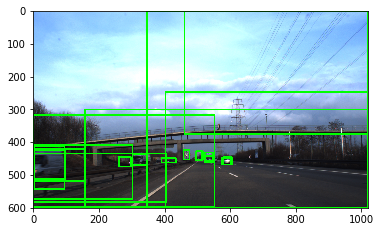

[[1.0000000e+00 1.4170159e-14]]
[[1.000000e+00 8.542654e-10]]
[[1.0000000e+00 1.1677162e-12]]
[[1.0000000e+00 1.0184706e-09]]
[[9.9999857e-01 1.4520324e-06]]
[[0.9780661  0.02193386]]
[[1.0000000e+00 3.3030703e-12]]
[[0.04846355 0.9515364 ]]
[[1.0000000e+00 2.0954885e-10]]
[[9.993656e-01 6.344401e-04]]
[[9.9995327e-01 4.6784917e-05]]
[[0.750537   0.24946299]]
[[1.000000e+00 2.833992e-09]]
[[1.0000000e+00 3.1962488e-11]]
[[9.9986875e-01 1.3120710e-04]]
[[1.0000000e+00 4.4937067e-15]]
[[1.0000000e+00 4.9557214e-10]]
[[9.999833e-01 1.665763e-05]]
[[9.9983501e-01 1.6496003e-04]]
[[0.63432866 0.3656714 ]]
[ 61.5  337.5  108.75 381.  ]


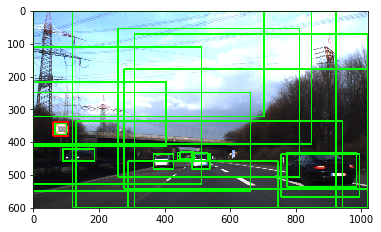

[[1.7827118e-07 9.9999988e-01]]
[[1.0000000e+00 4.7168146e-12]]
[[1.000000e+00 2.392012e-12]]
[[9.9969554e-01 3.0452589e-04]]
[[1.000000e+00 8.679423e-12]]
[[8.204013e-12 1.000000e+00]]
[[0.98632544 0.01367458]]
[[9.999999e-01 9.873492e-08]]
[[1.0000000e+00 8.6140915e-17]]
[[9.9999976e-01 2.7087017e-07]]
[[9.9999857e-01 1.4685294e-06]]
[[1.0000000e+00 2.0756254e-08]]
[[1.000000e+00 4.997452e-12]]
[[0.7393721  0.26062796]]
[[9.9963892e-01 3.6110656e-04]]
[[1.0000000e+00 1.7730289e-22]]
[[9.9999368e-01 6.2617187e-06]]
[[1.0000000e+00 1.0218922e-15]]
[[9.9978977e-01 2.1022916e-04]]
[[9.999944e-01 5.554181e-06]]
[951.   416.25 974.25 439.5 ]
[332.25 407.25 355.5  430.5 ]


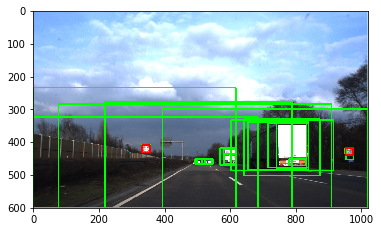

[[1.0000000e+00 3.0161096e-11]]
[[9.999999e-01 9.449643e-08]]
[[1.000000e+00 4.174887e-10]]
[[1.0000000e+00 4.7033577e-08]]
[[1.000000e+00 7.667878e-09]]
[[1.0000000e+00 1.1569833e-09]]
[[1.0000000e+00 2.8451435e-09]]
[[9.9999905e-01 9.2032099e-07]]
[[1.00000e+00 6.04377e-12]]
[[9.9951625e-01 4.8370074e-04]]
[[9.9951375e-01 4.8631523e-04]]
[[1.000000e+00 7.520457e-09]]
[[9.9999964e-01 4.0735162e-07]]
[[1.0000000e+00 2.7545294e-11]]
[[1.000e+00 5.666e-12]]
[[0.9947666  0.00523346]]
[[1.0000000e+00 1.6364746e-11]]
[[1.0000000e+00 1.4697676e-09]]
[[9.9999213e-01 7.9004813e-06]]
[[0.9960664 0.0039336]]
[270.75 333.75 312.75 375.  ]


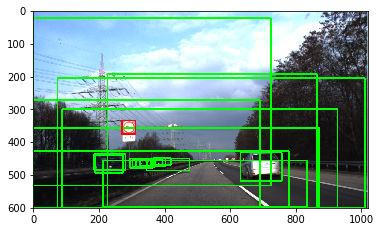

[[9.9973184e-01 2.6809351e-04]]
[[9.994141e-01 5.859567e-04]]
[[0.98830867 0.01169126]]
[[1.000000e+00 8.534669e-11]]
[[9.99895573e-01 1.04441046e-04]]
[[1.0000000e+00 3.2577512e-09]]
[[9.999999e-01 7.723364e-08]]
[[1.0000000e+00 1.5737605e-08]]
[[9.999999e-01 8.006481e-08]]
[[1.0000000e+00 3.6076786e-10]]
[[0.9555395  0.04446048]]
[[0.94936657 0.05063341]]
[[1.0000000e+00 1.9943223e-14]]
[[9.9977881e-01 2.2122034e-04]]
[[0.99745005 0.00254987]]
[[0.14815941 0.85184056]]
[[0.00138086 0.9986192 ]]
[[0.8889967  0.11100329]]
[[1.000000e+00 2.188677e-10]]
[[1.0000000e+00 1.0904265e-11]]
[273.75 361.5  327.75 409.5 ]


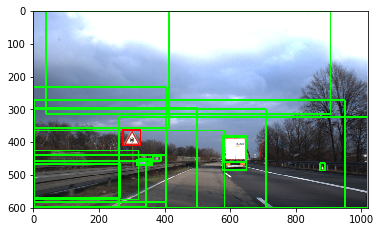

In [13]:
# run some tests

i=0

number_of_images = 5
number_of_boxes_to_draw = 20

for filename in test_images:
    # Draw predictions
    aux = test_images.get(filename)[0].copy()
    for bbox in test_pred.get(filename)[0][:number_of_boxes_to_draw]:
        cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (0,255,0), 3)
        
        
        # make a prediction
        roi = test_images.get(filename)[0][int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
        SIGN_SIZE_CNN = (32, 32)
        roi_resized = cv2.resize(roi, SIGN_SIZE_CNN)
        roi_resized = roi_resized.astype('float32')
        roi_resized /= 255.0
        roi_resized = np.reshape(roi_resized, [1,SIGN_SIZE_CNN[0],SIGN_SIZE_CNN[1],3])
    
        print(cnn.predict(roi_resized))

        
        # print contents of box if you like
#         not_a_sign = aux[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
#         plt.imshow(cv2.cvtColor(not_a_sign, cv2.COLOR_BGR2RGB))
#         plt.show()
            
    # Draw ground truth
    
    if filename in test_files:
        for idx in [i for i, x in enumerate(test_files) if x == filename]:
            bbox = test_bboxes[idx]
            print(bbox)
            cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (0,0,255), 3)
            
            # print contents of box if you like
#             sign = aux[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
#             plt.imshow(cv2.cvtColor(sign, cv2.COLOR_BGR2RGB))
#             plt.show()
    
    plt.imshow(cv2.cvtColor(aux, cv2.COLOR_BGR2RGB))
    plt.show()
    i+=1
    if i==number_of_images: break

### Evaluation using Mean Average Precision

git clone https://github.com/Cartucho/mAP.git

mkdir ground-truth

mkdir predicted

In [14]:
for filename in test_images:
    anns_ofs = open('mAP/input/ground-truth/' + filename[-9:-4:] + '.txt', 'w')
    if filename in test_files:
        for idx in [i for i, x in enumerate(test_files) if x == filename]:
            bbox = test_bboxes[idx]
            label = test_labels[idx]
            anns_ofs.write(str(label) + ' ' + str(bbox[0]) + ' ' + str(bbox[1]) + ' ' + str(bbox[2]) + ' ' + str(bbox[3]) + '\n')
    anns_ofs.close()

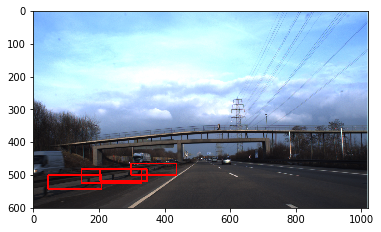

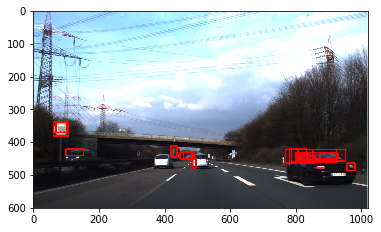

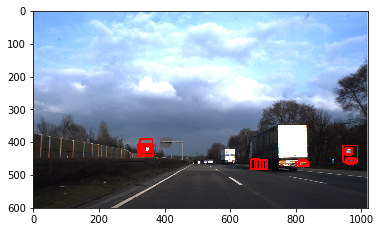

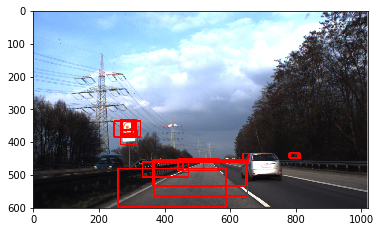

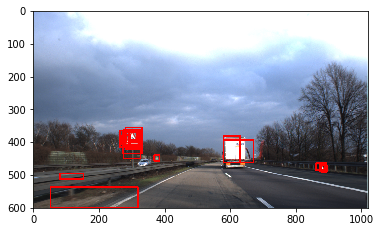

...

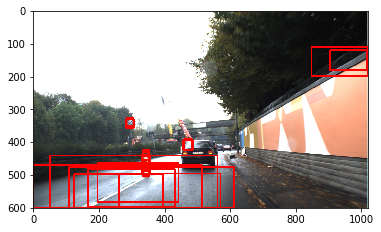

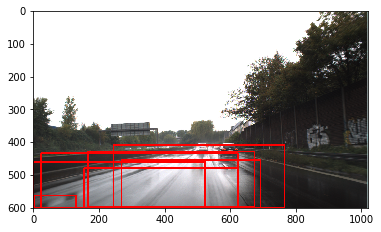

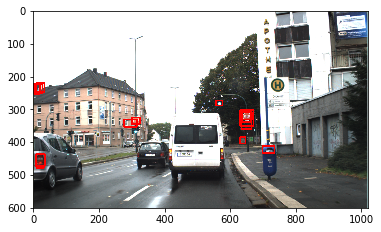

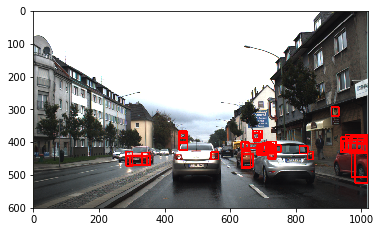

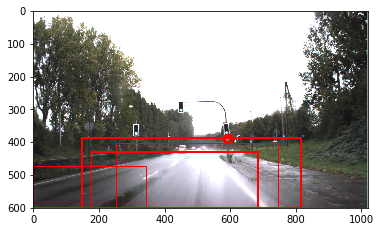

In [ ]:
start = time()
for filename in test_images:
    prds_ofs = open('mAP/input/detection-results/' + filename[-9:-4:] + '.txt', 'w')
    aux = test_images.get(filename)[0].copy()
    
    for bbox in test_pred.get(filename)[0]:
        
        
        roi = test_images.get(filename)[0][int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
        SIGN_SIZE_CNN = (32, 32)
        roi_resized = cv2.resize(roi, SIGN_SIZE_CNN)
        roi_resized = roi_resized.astype('float32')
        roi_resized /= 255.0
        roi_resized = np.reshape(roi_resized, [1,SIGN_SIZE_CNN[0],SIGN_SIZE_CNN[1],3])
    
        confidence = cnn.predict(roi_resized)
        if confidence[0][1] > 0.9:
            cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (0,0,255), 3)

        ## class
        sign_class = cnn_classifier.predict(roi_resized)
        
        # traffic_sign_class confidence bbox
        prds_ofs.write(str(np.argmax(sign_class[0])) + ' ' + str(confidence[0][1]) + ' ' + str(bbox[0]) + ' ' + str(bbox[1]) + ' ' + str(bbox[2]) + ' ' + str(bbox[3]) + '\n')
    prds_ofs.close()
    plt.imshow(cv2.cvtColor(aux, cv2.COLOR_BGR2RGB))
    plt.show()
end = time()
print("Traffic sign detection took " + str(end - start) + " seconds")

In [60]:
# Follow previous mAP code in order to evaluate the performance of your neural net

%run /home/filip_finfando/dl/assignment_3_4/mAP/main.py -na -np
%cd -q

0.00% = 1 AP 
0.00% = 10 AP 
0.00% = 11 AP 
0.00% = 12 AP 
0.00% = 13 AP 
0.00% = 14 AP 
0.00% = 15 AP 
0.00% = 16 AP 
0.00% = 17 AP 
0.00% = 18 AP 
0.00% = 2 AP 
0.00% = 22 AP 
0.00% = 23 AP 
0.00% = 24 AP 
0.00% = 25 AP 
0.00% = 26 AP 
0.00% = 28 AP 
0.00% = 29 AP 
0.00% = 3 AP 
0.00% = 30 AP 
0.00% = 31 AP 
0.00% = 32 AP 
0.00% = 33 AP 
0.00% = 34 AP 
0.00% = 35 AP 
0.00% = 36 AP 
0.00% = 37 AP 
0.00% = 38 AP 
0.00% = 39 AP 
0.00% = 4 AP 
0.00% = 40 AP 
0.00% = 41 AP 
0.00% = 42 AP 
0.00% = 5 AP 
0.00% = 6 AP 
0.00% = 7 AP 
0.00% = 8 AP 
0.00% = 9 AP 
mAP = 0.00%


In [ ]:
# Sample results obtained using my detector
46.54% = 1 AP 
54.70% = 10 AP 
54.20% = 11 AP 
54.07% = 12 AP 
66.81% = 13 AP 
66.75% = 14 AP 
72.33% = 15 AP 
100.00% = 16 AP 
65.48% = 17 AP 
26.45% = 18 AP 
44.28% = 2 AP 
37.50% = 22 AP 
69.44% = 23 AP 
0.00% = 24 AP 
43.19% = 25 AP 
54.76% = 26 AP 
20.00% = 28 AP 
0.00% = 29 AP 
53.95% = 3 AP 
70.00% = 30 AP 
0.00% = 31 AP 
35.50% = 32 AP 
86.67% = 33 AP 
83.33% = 34 AP 
76.33% = 35 AP 
0.00% = 36 AP 
0.00% = 37 AP 
41.90% = 38 AP 
0.00% = 39 AP 
52.49% = 4 AP 
55.56% = 40 AP 
0.00% = 41 AP 
69.17% = 42 AP 
57.24% = 5 AP 
57.14% = 6 AP 
33.96% = 7 AP 
65.57% = 8 AP 
70.15% = 9 AP 
mAP = 46.99%
<Figure size 432x288 with 0 Axes>